# Medical Image Analysis 

# Automated Capillary Segmentation and Quantification in Nailfold Capillaroscopy Images
**Author:** Sadia Saeed  
**Institution:** Université Bourgogne Europe  
**Supervisors:** Stephanie Bricq, Maya Faraji Zamharir


### **Objective**

The objective of this project is to develop an automated system to either:

1. Segment capillaries in nailfold images across both normal and pathological classes.
2. Automatically count the number of visible capillaries within a defined capillary segment.


## Methodology

We employ two distinct approaches to segment and count nailfold capillaries:

1. **Traditional Image Processing Techniques**  
   This approach uses classical methods such as filtering, edge detection, and morphological operations to identify and segment capillaries.

2. **Deep Learning-Based Approach**  
   This method use Yolov8 to enhance segmentation accuracy and robustness, particularly in pathological cases.

The following flowchart illustrates the overall pipeline more clearly:

![Flowchart of Capillary Processing Pipeline: Two parallel approaches - Traditional Image Processing (filtering, edge detection, morphological operations) and Deep Learning with YOLOv8 - both converging on capillary segmentation and counting from nailfold images](flowchart.png)


## Import Statements

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage import measure, morphology
from glob import glob

# Set matplotlib to display images inline
%matplotlib inline

## Extract Region of Interest

### Purpose

This function detects a black line marking the capillary ROI in nailfold images, aligns it horizontally, and extracts a consistent rectangular region just above it. It returns the rotated image, ROI coordinates, and rotation angle. This preprocessing step improves consistency and focus for downstream tasks like segmentation or analysis.

### Steps

1. **Convert to grayscale and threshold**  
   Apply an inverse binary threshold to isolate dark pixels, this highlights black lines.

2. **Find contours**  
   Detect all external contours. We assume the black line is one of these.

3. **Fallback case**  
   If no black line is found, return the original image with the whole image as ROI.

4. **Fit a line to the largest contour**  
   `cv2.fitLine` estimates the direction vector of this line.

5. **Compute rotation angle**  
   Convert it into degrees and compute the correction angle.

6. **Rotate the image**  
   Apply affine transformation to align the black line horizontally.

7. **Transform the contour and find the line's vertical position**  
   After rotation, extract the Y-coordinate (height) of the black line.

8. **Determine ROI size**  
   The height of the ROI is a fraction of the line height or image height.

9. **Define ROI coordinates**  
   - **Y-range:** from above the line to the line  
   - **X-range:** around the extent of the black line with some buffer


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage import measure, morphology
from glob import glob

# Set matplotlib to display images inline
%matplotlib inline

def align_image_to_black_line(img, display_steps=False):
    """
    Enhanced version with better ROI selection above the black line
    Returns rotated image and ROI coordinates (x_start, x_end, y_line, box_height)
    """
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, black_mask = cv2.threshold(gray, 30, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(black_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if not contours:
        if display_steps:
            print("No black line detected")
        h, w = img.shape[:2]
        return img, (0, w, h, h), 0.0
    
    largest_contour = max(contours, key=cv2.contourArea)
    [vx, vy, x_fit, y_fit] = cv2.fitLine(largest_contour, cv2.DIST_L2, 0, 0.01, 0.01)
    vx, vy, x_fit, y_fit = vx[0], vy[0], x_fit[0], y_fit[0]
    
    angle_rad = np.arctan2(vy, vx)
    angle_deg = np.degrees(angle_rad)
    rotation_angle = angle_deg - 90 if angle_deg > 45 else angle_deg
    
    h_img, w_img = img.shape[:2]
    M = cv2.getRotationMatrix2D((w_img/2, h_img/2), rotation_angle, 1)
    rotated_img = cv2.warpAffine(img, M, (w_img, h_img), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    
    rotated_contour = cv2.transform(largest_contour, M)
    y_positions = [pt[0][1] for pt in rotated_contour]
    x_positions = [pt[0][0] for pt in rotated_contour]
    
    line_position = int(np.median(y_positions))
    x_min, x_max = int(min(x_positions)), int(max(x_positions))
    
    max_box_height = int(cv2.boundingRect(largest_contour)[3] * 0.65)
    box_height = min(int(h_img * 0.3), max_box_height)
    
    y_start = max(0, line_position - box_height)
    x_start = max(0, x_min - 10)
    x_end = min(w_img, x_max + 10)
    
    if display_steps:
        viz = rotated_img.copy()
        cv2.rectangle(viz, (x_start, y_start), (x_end, line_position), (0,255,0), 2)
        # plt.figure(figsize=(12,6))
        # plt.imshow(cv2.cvtColor(viz, cv2.COLOR_BGR2RGB))
        # plt.title(f"ROI Selection (Height: {box_height}px)")
        # plt.axis('off')
        # plt.show()
    
    return rotated_img, (x_start, x_end, line_position, box_height), rotation_angle

# Load the image first
sample_image_path = "DATA/DATA/N1/N1a.jpg"  # This is only for sample image.
img = cv2.imread(sample_image_path)

if img is not None:
    rotated_img, roi_coords, angle = align_image_to_black_line(img, display_steps=True)
else:
    print(f"Failed to load image at {sample_image_path}")


## Approach 1: Capillary Detection using Traditional Image Processing

As a first approach, we developed a classical image processing pipeline tailored for nailfold capillary segmentation. The goal is to extract the capillary region from the aligned image and estimate the capillary count based on shape and size descriptors.


## Pipeline Overview

### 1. ROI Extraction:

Use the black reference line to isolate a horizontal rectangular region above it.

### 2. Contrast Enhancement:
Apply CLAHE to enhance local contrast and improve visibility of fine capillary structures.[Zuiderveld, 1994 – CLAHE Paper](https://www.cse.unr.edu/~bebis/CS474/StudentPaperPresentations/1994%20-%20CLAHE.pdf)

### 3. Capillary Enhancement (Tubular Structures):

Enhance vessel-like structures using the Hessian matrix and eigenvalue analysis. This technique enhances line-like and elongated features, commonly used in vesselness filters. [Frangi, Alejandro F. - Multiscale vessel enhancement filtering](https://link.springer.com/chapter/10.1007/bfb0056195)

### 4. Binarization with Adaptive Thresholding:
After vessel enhancement we applie adaptive Gaussian thresholding to binarize the image by using opencv "cv2.adaptiveThreshold" function

### 5. Morphological Operations
To reduce noise and disconnect falsely connected structures we Applied opening (erosion followed by dilation) to remove small artifacts and then closing (dilation followed by erosion) to fill small holes. [scikit-image Morphological Filtering](https://scikit-image.org/docs/0.25.x/auto_examples/applications/plot_morphology.html)

### 6. Connected Component Analysis
Label connected regions in the binary mask and apply filters based on:
Area: Keep blobs between pixels².
Shape: Compute eccentricity to keep only elongated blobs (eccentricity > 0.6), rejecting circular ones.
### 7. Counting and Visualization
For each filtered component, we calculate the centroid, then Draw a label and overlay a colored mask over the original ROI, and then Display the total count and visually validate the result.



C:\Users\Sadia Saeed\AppData\Local\Temp\ipykernel_1952\3323052858.py:77: FutureWarning: `RegionProperties.minor_axis_length` is deprecated starting in version 0.26 and will be removed in version 2.0. Use `RegionProperties.axis_minor_length` instead. 
  if region.minor_axis_length > 0:
C:\Users\Sadia Saeed\AppData\Local\Temp\ipykernel_1952\3323052858.py:78: FutureWarning: `RegionProperties.minor_axis_length` is deprecated starting in version 0.26 and will be removed in version 2.0. Use `RegionProperties.axis_minor_length` instead. 
  eccentricity = np.sqrt(1 - (region.minor_axis_length/region.major_axis_length)**2)
C:\Users\Sadia Saeed\AppData\Local\Temp\ipykernel_1952\3323052858.py:78: FutureWarning: `RegionProperties.major_axis_length` is deprecated starting in version 0.26 and will be removed in version 2.0. Use `RegionProperties.axis_major_length` instead. 
  eccentricity = np.sqrt(1 - (region.minor_axis_length/region.major_axis_length)**2)
C:\Users\Sadia Saeed\AppData\Local\Temp\ip

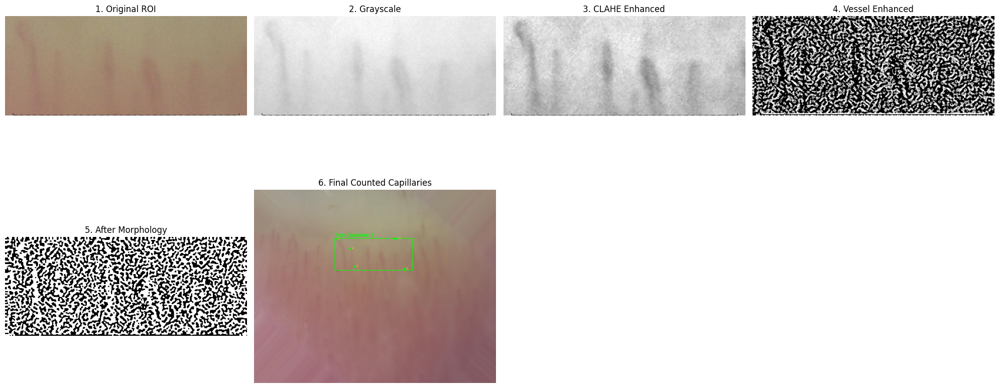

Final capillary count: 6


In [3]:
def process_image(image_path, display_steps=False):
    """
    Focused capillary counting in the ROI using optimized traditional image processing
    """
    # 1. Load image and get ROI
    original_img = cv2.imread(image_path)
    if original_img is None:
        print(f"Could not load image: {image_path}")
        return 0

    # Get aligned image and ROI coordinates
    rotated_img, (x_start, x_end, line_position, box_height), _ = align_image_to_black_line(original_img, display_steps)
    
    # 2. Extract ROI (region above the black line)
    y_start = max(0, line_position - box_height)
    roi = rotated_img[y_start:line_position, x_start:x_end]
    
    # 3. ROI-specific processing
    # Green channel extraction (better for capillaries)
    gray = roi[:,:,1].copy()
    
    # Optimized CLAHE for ROI
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(6,6))
    enhanced = clahe.apply(gray)
    
    # 4. Capillary enhancement
    # Hessian-based enhancement for tubular structures
    def hessian_enhance(img, sigma=1.1):
        """Enhanced vessel detection using Hessian matrix"""
        # Gaussian blur
        img = cv2.GaussianBlur(img, (0,0), sigma)
        
        # Gradient calculation
        gx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)
        gy = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)
        
        # Second derivatives
        gxx = cv2.Sobel(gx, cv2.CV_32F, 1, 0, ksize=3)
        gxy = cv2.Sobel(gx, cv2.CV_32F, 0, 1, ksize=3)
        gyy = cv2.Sobel(gy, cv2.CV_32F, 0, 1, ksize=3)
        
        # Eigenvalue calculation
        lambda1 = 0.5*(gxx + gyy + np.sqrt((gxx - gyy)**2 + 4*gxy**2))
        lambda2 = 0.5*(gxx + gyy - np.sqrt((gxx - gyy)**2 + 4*gxy**2))
        
        # Vesselness measure
        with np.errstate(divide='ignore', invalid='ignore'):
            Rb = (lambda1/lambda2)**2
            S = np.sqrt(lambda1**2 + lambda2**2)
            vesselness = np.exp(-Rb/0.5) * (1 - np.exp(-S/10))
            vesselness = np.nan_to_num(vesselness)
        
        return (255 * vesselness / vesselness.max()).astype(np.uint8) if vesselness.max() > 0 else vesselness
    
    vessel_enhanced = hessian_enhance(enhanced)
    
    # 5. Adaptive thresholding
    binary = cv2.adaptiveThreshold(vessel_enhanced, 255, 
                                 cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                 cv2.THRESH_BINARY_INV,15 , 3)
    
    # 6. Morphological refinement
    kernel = np.ones((2,2), np.uint8)
    cleaned = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_CLOSE, kernel)
    
    # 7. Connected component analysis
    labels = measure.label(cleaned, connectivity=2)
    
    # Capillary counting with size/shape constraints
    capillary_count = 0
    min_area, max_area = 32, 300  # Pixel area range for capillaries
    
    for region in measure.regionprops(labels):
        if min_area <= region.area <= max_area:
            # Basic shape filtering
            if region.minor_axis_length > 0:
                eccentricity = np.sqrt(1 - (region.minor_axis_length/region.major_axis_length)**2)
                if eccentricity > 0.6:  # Keep elongated structures
                    capillary_count += 1

    # 8. Enhanced Visualization
    if display_steps:
        plt.figure(figsize=(20, 10))  # Increased size for better visibility
        
        # Show selected processing steps
        steps = [
            ('1. Original ROI', cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)),
            ('2. Grayscale', gray, 'gray'),
            ('3. CLAHE Enhanced', enhanced, 'gray'),
            ('4. Vessel Enhanced', vessel_enhanced, 'gray'),
            ('5. After Morphology', cleaned, 'gray')
        ]

        for i, (title, img, *cmap) in enumerate(steps, 1):
            plt.subplot(2, 4, i)
            plt.imshow(img, cmap[0] if cmap else None)
            plt.title(title)
            plt.axis('off')

        # 6. Final counted capillaries with bounding boxes
        result_img = rotated_img.copy()
        cv2.rectangle(result_img, (x_start, y_start), (x_end, line_position), (0, 255, 0), 2)

        counter = 1
        for region in measure.regionprops(labels):
            if min_area <= region.area <= max_area and region.minor_axis_length > 0:
                eccentricity = np.sqrt(1 - (region.minor_axis_length / region.major_axis_length) ** 2)
                if eccentricity > 0.6:
                    y_roi, x_roi = region.centroid
                    x_img = int(x_roi) + x_start
                    y_img = int(y_roi) + y_start
                    cv2.circle(result_img, (x_img, y_img), 5, (0, 255, 0), -1)
                    cv2.putText(result_img, str(counter), (x_img + 10, y_img),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 255), 1)
                    counter += 1

        cv2.putText(result_img, f'Total Capillaries: {capillary_count}',
                    (x_start, max(y_start - 10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

        plt.subplot(2, 4, 6)
        plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
        plt.title('6. Final Counted Capillaries')
        plt.axis('off')

        plt.tight_layout()
        plt.show()


        return capillary_count
    
sample_image_path = "DATA/DATA/N1/N1a.jpg"  # Replace with actual path
try:
    count = process_image(sample_image_path, display_steps=True)
    print(f"Final capillary count: {count}")
except Exception as e:
    print(f"Error processing image: {e}")
    

## Applying to the Entire Dataset

We first apply our traditional image processing pipeline to a single annotated image and compare the number of detected capillaries with the ground truth.

After confirming accuracy on this test case, we extend the evaluation to the entire dataset. We compare our algorithm’s capillary counts with the ground truth annotations across all images. This comprehensive evaluation allows us to assess the overall robustness and reliability of our approach.



Processing N1a...


C:\Users\Sadia Saeed\AppData\Local\Temp\ipykernel_1952\792788857.py:98: FutureWarning: `RegionProperties.minor_axis_length` is deprecated starting in version 0.26 and will be removed in version 2.0. Use `RegionProperties.axis_minor_length` instead. 
  if min_area <= region.area <= max_area and region.minor_axis_length > 0:
C:\Users\Sadia Saeed\AppData\Local\Temp\ipykernel_1952\792788857.py:99: FutureWarning: `RegionProperties.minor_axis_length` is deprecated starting in version 0.26 and will be removed in version 2.0. Use `RegionProperties.axis_minor_length` instead. 
  eccentricity = np.sqrt(1 - (region.minor_axis_length/region.major_axis_length)**2)
C:\Users\Sadia Saeed\AppData\Local\Temp\ipykernel_1952\792788857.py:99: FutureWarning: `RegionProperties.major_axis_length` is deprecated starting in version 0.26 and will be removed in version 2.0. Use `RegionProperties.axis_major_length` instead. 
  eccentricity = np.sqrt(1 - (region.minor_axis_length/region.major_axis_length)**2)
C:\Us

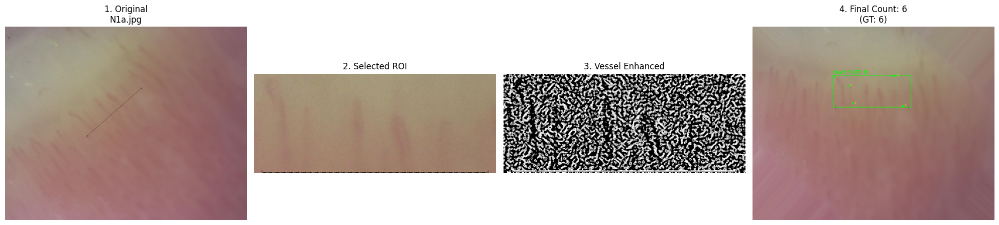


Processing N1b...


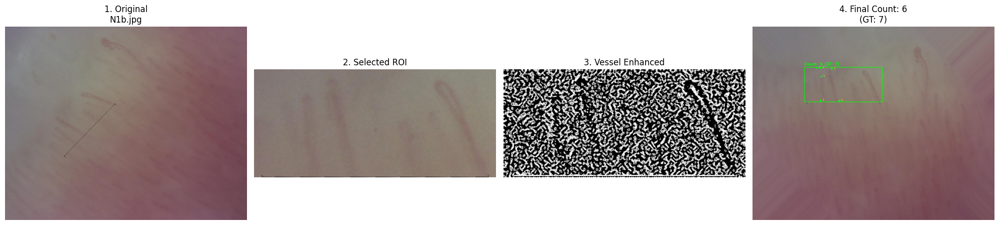


Processing N1c...


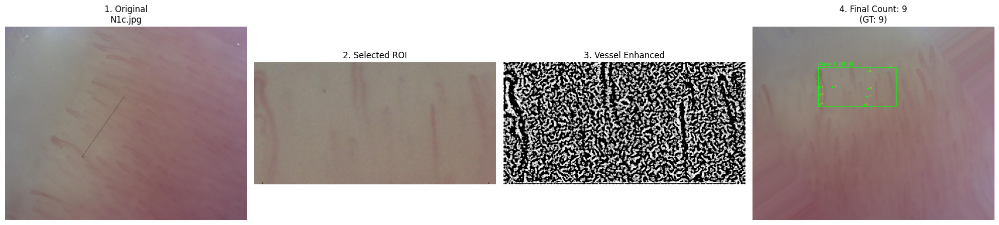


Processing N1d...


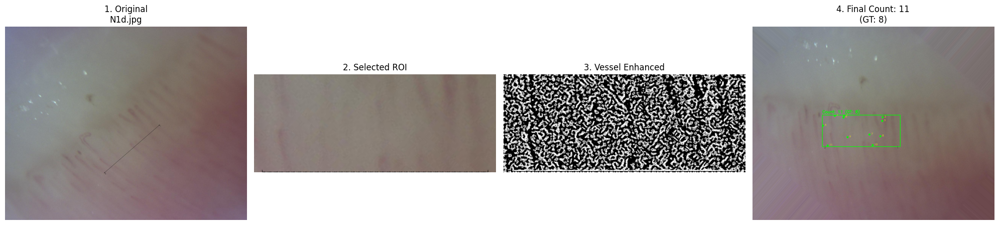


Processing N1e...


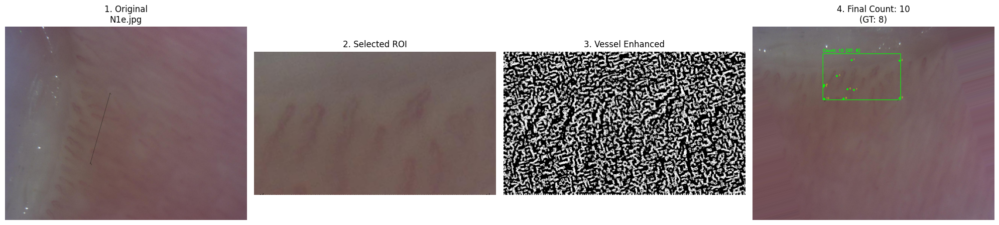


Processing N1f...


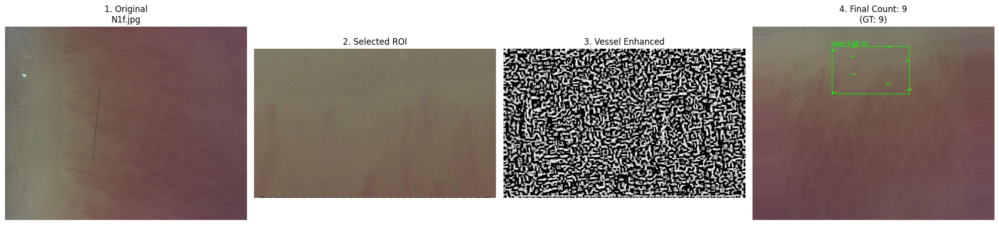


Processing N1g...


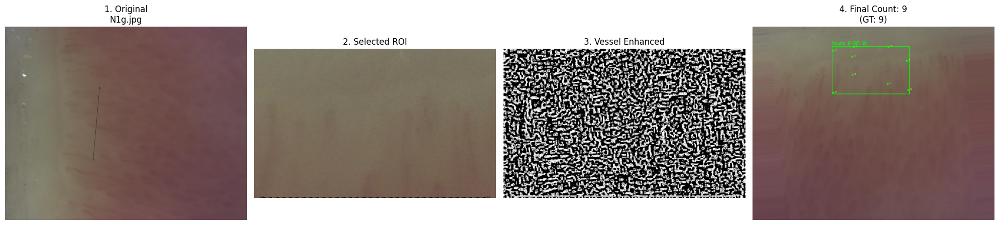


Processing N1h...


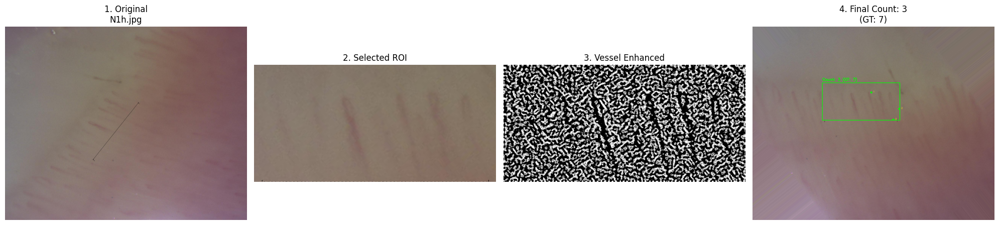


Processing N1i...


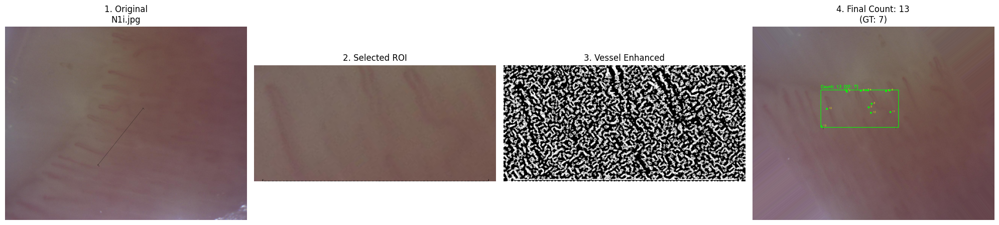


Processing N1j...


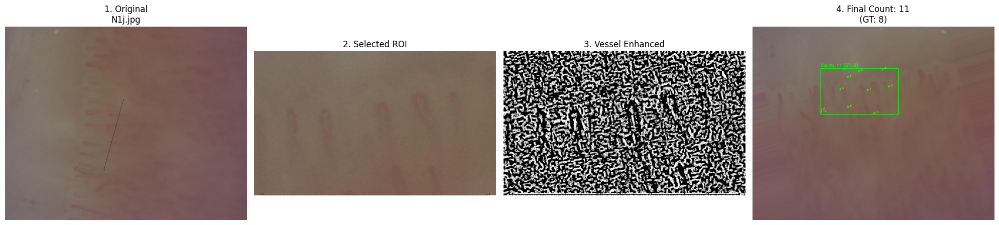

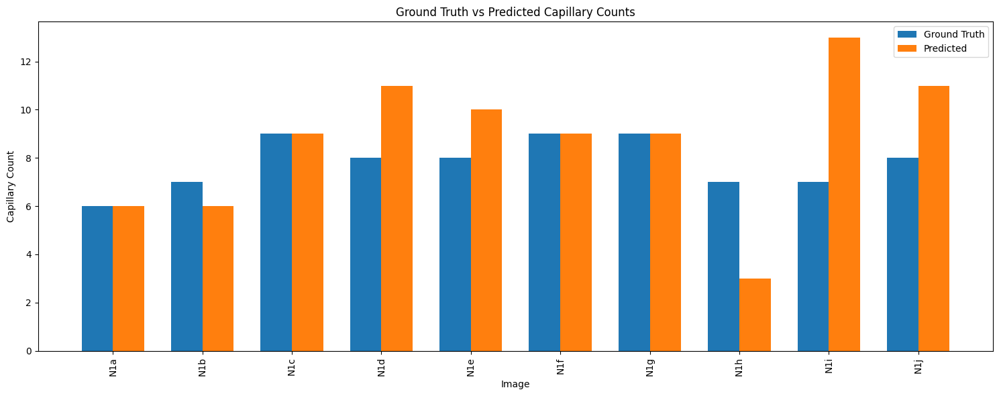


=== Final Evaluation ===
Mean Absolute Error: 1.90


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from skimage import measure, morphology
from glob import glob

# Set matplotlib to display images inline
%matplotlib inline

def align_image_to_black_line(img, display_steps=False):
    """Align image based on black reference line and return ROI coordinates"""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, black_mask = cv2.threshold(gray, 30, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(black_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if not contours:
        h, w = img.shape[:2]
        return img, (0, w, h, h), 0.0
    
    largest_contour = max(contours, key=cv2.contourArea)
    [vx, vy, x_fit, y_fit] = cv2.fitLine(largest_contour, cv2.DIST_L2, 0, 0.01, 0.01)
    vx, vy, x_fit, y_fit = vx[0], vy[0], x_fit[0], y_fit[0]
    
    angle_rad = np.arctan2(vy, vx)
    angle_deg = np.degrees(angle_rad)
    rotation_angle = angle_deg - 90 if angle_deg > 45 else angle_deg
    
    h_img, w_img = img.shape[:2]
    M = cv2.getRotationMatrix2D((w_img/2, h_img/2), rotation_angle, 1)
    rotated_img = cv2.warpAffine(img, M, (w_img, h_img), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    
    rotated_contour = cv2.transform(largest_contour, M)
    y_positions = [pt[0][1] for pt in rotated_contour]
    x_positions = [pt[0][0] for pt in rotated_contour]
    
    line_position = int(np.median(y_positions))
    x_min, x_max = int(min(x_positions)), int(max(x_positions))
    max_box_height = int(cv2.boundingRect(largest_contour)[3] * 0.65)
    box_height = min(int(h_img * 0.3), max_box_height)
    y_start = max(0, line_position - box_height)
    x_start = max(0, x_min - 10)
    x_end = min(w_img, x_max + 10)
    
    return rotated_img, (x_start, x_end, line_position, box_height), rotation_angle

def process_and_visualize(image_path, ground_truth_count):
    """Process single image and generate required visualizations"""
    # Load and process image
    original_img = cv2.imread(image_path)
    if original_img is None:
        print(f"Could not load image: {image_path}")
        return None
    
    # Get aligned image and ROI
    rotated_img, (x_start, x_end, line_position, box_height), _ = align_image_to_black_line(original_img)
    y_start = max(0, line_position - box_height)
    roi = rotated_img[y_start:line_position, x_start:x_end]
    
    # Processing pipeline
    gray = roi[:,:,1].copy()
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(6,6))
    enhanced = clahe.apply(gray)
    
    # Vessel enhancement
    def hessian_enhance(img, sigma=1.1):
        img = cv2.GaussianBlur(img, (0,0), sigma)
        gx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)
        gy = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)
        gxx = cv2.Sobel(gx, cv2.CV_32F, 1, 0, ksize=3)
        gxy = cv2.Sobel(gx, cv2.CV_32F, 0, 1, ksize=3)
        gyy = cv2.Sobel(gy, cv2.CV_32F, 0, 1, ksize=3)
        lambda1 = 0.5*(gxx + gyy + np.sqrt((gxx - gyy)**2 + 4*gxy**2))
        lambda2 = 0.5*(gxx + gyy - np.sqrt((gxx - gyy)**2 + 4*gxy**2))
        with np.errstate(divide='ignore', invalid='ignore'):
            Rb = (lambda1/lambda2)**2
            S = np.sqrt(lambda1**2 + lambda2**2)
            vesselness = np.exp(-Rb/0.5) * (1 - np.exp(-S/10))
            vesselness = np.nan_to_num(vesselness)
        return (255 * vesselness / vesselness.max()).astype(np.uint8) if vesselness.max() > 0 else vesselness
    
    vessel_enhanced = hessian_enhance(enhanced)
    
    # Thresholding and cleaning
    binary = cv2.adaptiveThreshold(vessel_enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                 cv2.THRESH_BINARY_INV, 15, 3)
    kernel = np.ones((2,2), np.uint8)
    cleaned = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_CLOSE, kernel)
    
    # Counting capillaries
    labels = measure.label(cleaned, connectivity=2)
    capillary_count = 0
    min_area, max_area = 32, 300
    
    for region in measure.regionprops(labels):
        if min_area <= region.area <= max_area and region.minor_axis_length > 0:
            eccentricity = np.sqrt(1 - (region.minor_axis_length/region.major_axis_length)**2)
            if eccentricity > 0.6:
                capillary_count += 1
    
    # Create visualization figure
    plt.figure(figsize=(20, 5))
    img_name = os.path.basename(image_path)
    
    # 1. Original Image
    plt.subplot(1, 4, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title(f'1. Original\n{img_name}')
    plt.axis('off')
    
    # 2. ROI
    plt.subplot(1, 4, 2)
    plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))
    plt.title('2. Selected ROI')
    plt.axis('off')
    
    # 3. Vessel Enhanced
    plt.subplot(1, 4, 3)
    plt.imshow(vessel_enhanced, cmap='gray')
    plt.title('3. Vessel Enhanced')
    plt.axis('off')
    
    # 4. Final Counted Capillaries
    result_img = rotated_img.copy()
    cv2.rectangle(result_img, (x_start, y_start), (x_end, line_position), (0, 255, 0), 2)
    
    counter = 1
    for region in measure.regionprops(labels):
        if min_area <= region.area <= max_area and region.minor_axis_length > 0:
            eccentricity = np.sqrt(1 - (region.minor_axis_length/region.major_axis_length)**2)
            if eccentricity > 0.6:
                y_roi, x_roi = region.centroid
                x_img = int(x_roi) + x_start
                y_img = int(y_roi) + y_start
                cv2.circle(result_img, (x_img, y_img), 5, (0, 255, 0), -1)
                cv2.putText(result_img, str(counter), (x_img + 10, y_img),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 255), 1)
                counter += 1
    
    cv2.putText(result_img, f'Count: {capillary_count} (GT: {ground_truth_count})',
               (x_start, max(y_start - 10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
    
    plt.subplot(1, 4, 4)
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.title(f'4. Final Count: {capillary_count}\n(GT: {ground_truth_count})')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return capillary_count

def evaluate_all_images():
    """Process all images and generate final comparison"""
    # Ground truth data
    ground_truth = {
        'N1a': 6, 'N1b': 7, 'N1c': 9, 'N1d': 8, 'N1e': 8, 'N1f': 9, 'N1g': 9, 'N1h': 7, 'N1i': 7, 'N1j': 8,
        # 'N2a': 11, 'N2b': 10, 'N2c': 9,
        # 'S2a': 1, 'S2b': 2, 'S2c': 2, 'S2d': 5, 'S2e': 4, 'S2f': 1, 'S2g': 4,
        # 'S3a': 5, 'S3b': 5, 'S3c': 2, 'S3d': 5, 'S3e': 5, 'S3f': 4, 'S3g': 5, 'S3h': 4, 'S3i': 2, 'S3j': 5
    
    }
    
    results = []
    
    # Process each series
    # for series in ['N1', 'N2', 'S2', 'S3']:
    for series in ['N1']:
        image_folder = f"DATA/DATA/{series}/"
        image_paths = glob(os.path.join(image_folder, "*.jpg"))
        
        for img_path in image_paths:
            img_name = os.path.basename(img_path).split('.')[0]
            if img_name in ground_truth:
                try:
                    gt_count = ground_truth[img_name]
                    print(f"\nProcessing {img_name}...")
                    
                    # Process and visualize this image
                    processed_count = process_and_visualize(img_path, gt_count)
                    
                    if processed_count is not None:
                        error = abs(processed_count - gt_count)
                        results.append({
                            'Image': img_name,
                            'Ground Truth': gt_count,
                            'Predicted': processed_count,
                            'Error': error,
                            'Series': series
                        })
                except Exception as e:
                    print(f"Error processing {img_name}: {str(e)}")
    
    # Create final comparison plot
    if results:
        results_df = pd.DataFrame(results)
        
        plt.figure(figsize=(15, 6))
        x = range(len(results_df))
        width = 0.35
        
        plt.bar([i - width/2 for i in x], results_df['Ground Truth'], width, label='Ground Truth')
        plt.bar([i + width/2 for i in x], results_df['Predicted'], width, label='Predicted')
        
        plt.xticks(x, results_df['Image'], rotation=90)
        plt.xlabel('Image')
        plt.ylabel('Capillary Count')
        plt.title('Ground Truth vs Predicted Capillary Counts')
        plt.legend()
        plt.tight_layout()
        plt.show()
        
        # Calculate and print statistics
        accuracy = len(results_df[results_df['Error'] == 0]) / len(results_df)
        mean_error = results_df['Error'].mean()
        
        print("\n=== Final Evaluation ===")
        # print(f"Accuracy: {accuracy:.1%}")
        print(f"Mean Absolute Error: {mean_error:.2f}")
        
        return results_df
    return None

# Run the full evaluation
results_df = evaluate_all_images()

# Save results if needed
if results_df is not None:
    results_df.to_csv('capillary_counting_results.csv', index=False)

---
## Transition to Deep Learning

Although our traditional image processing pipeline showed some success, its performance was not reliable across all images. To address these limitations and improve robustness, we transitioned to a deep learning-based approach for capillary segmentation and counting.

For training the deep learning model, we took inspiration from the paper:  
[**YOLOv8-Based System for Nail Capillary Detection**](https://pmc.ncbi.nlm.nih.gov/articles/PMC11394581/pdf/diagnostics-14-01843.pdf)


## Approach 2: Deep Learning-Based Capillary Segmentation

We followed the steps below to build a segmentation model using YOLOv8:

### 1. Manual Annotation
We manually annotated capillaries in both the extracted ROI regions and full images (to improve generalization) using [Roboflow](https://roboflow.com/).  
Annotations were exported in Pascal VOC XML format, using either polygon masks or bounding boxes.


In [5]:
import os
import xml.etree.ElementTree as ET
from sklearn.model_selection import train_test_split
import shutil
import yaml
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import glob

### 2. VOC to YOLOv8 Format Conversion

We implemented a script to perform the following tasks:

- Parse the XML files (Pascal VOC format).
- Convert polygon or bounding box annotations to YOLOv8-compatible segmentation format.
- Normalize coordinates based on the corresponding image dimensions.
- Save the converted annotations as `.txt` files, aligned with YOLOv8 mask training requirements.


In [6]:
def convert_voc_to_yolo(xml_path, output_dir, class_names):
    """Convert VOC XML annotations to YOLO format txt files for segmentation"""
    tree = ET.parse(xml_path)
    root = tree.getroot()
    
    # Get image dimensions
    size = root.find('size')
    img_width = int(size.find('width').text)
    img_height = int(size.find('height').text)
    
    # Create output file
    txt_filename = os.path.splitext(os.path.basename(xml_path))[0] + '.txt'
    txt_path = os.path.join(output_dir, txt_filename)
    
    with open(txt_path, 'w') as f:
        for obj in root.findall('object'):
            class_name = obj.find('name').text
            class_id = class_names.index(class_name)
            
            # Get polygon points (required for segmentation)
            polygon = obj.find('polygon')
            if polygon is not None:
                points = []
                for i in range(1, len(polygon) // 2 + 1):
                    try:
                        x = float(polygon.find(f'x{i}').text) / img_width
                        y = float(polygon.find(f'y{i}').text) / img_height
                        points.extend([x, y])
                    except (AttributeError, ValueError):
                        continue
                
                if len(points) >= 6:  # Need at least 3 points (x,y pairs)
                    points_str = ' '.join(map(str, points))
                    f.write(f"{class_id} {points_str}\n")
            else:
                # Fallback to bounding box if no polygon (not ideal for segmentation)
                bndbox = obj.find('bndbox')
                if bndbox is not None:
                    xmin = int(float(bndbox.find('xmin').text)) / img_width
                    xmax = int(float(bndbox.find('xmax').text)) / img_width
                    ymin = int(float(bndbox.find('ymin').text)) / img_height
                    ymax = int(float(bndbox.find('ymax').text)) / img_height
                    # Convert bbox to polygon (rectangle)
                    points = [
                        xmin, ymin,
                        xmax, ymin,
                        xmax, ymax,
                        xmin, ymax
                    ]
                    points_str = ' '.join(map(str, points))
                    f.write(f"{class_id} {points_str}\n")



### 3. Dataset Preparation

The dataset is split into training and validation sets. The preparation script performs the following tasks:

- Organizes images and labels into their respective folders:  
  `images/train`, `images/val`, `labels/train`, and `labels/val`.

- Generates a `capillary_dataset.yaml` configuration file required by YOLOv8, specifying:
  - Paths to training and validation image/label directories.
  - Class names (e.g., `['normal']`, `['pathological']`).


In [7]:
def prepare_dataset(dataset_dir, output_dir):
    """Prepare dataset in YOLO format with train/val split"""
    # Auto-detect class names from XML files in dataset_dir.
    # This avoids hardcoding (e.g., ['pathological']) which causes ValueError when
    # annotations contain other class names like 'normal'.
    class_names = []
    for fname in os.listdir(dataset_dir):
        if fname.lower().endswith('.xml'):
            try:
                tree = ET.parse(os.path.join(dataset_dir, fname))
                root = tree.getroot()
                for obj in root.findall('object'):
                    name = obj.find('name')
                    if name is not None:
                        nm = name.text.strip()
                        if nm and nm not in class_names:
                            class_names.append(nm)
            except Exception:
                # Skip malformed XMLs
                continue
    # Fallback if no classes found
    if not class_names:
        class_names = ['normal']
    class_names = sorted(class_names)
    
    # Create directories
    images_dir = os.path.join(output_dir, 'images')
    labels_dir = os.path.join(output_dir, 'labels')
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(labels_dir, exist_ok=True)
    
    # Get all image files
    image_files = [f for f in os.listdir(dataset_dir) 
                 if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    # Split into train and validation
    train_files, val_files = train_test_split(image_files, test_size=0.2, random_state=42)
    
    # Create train/val directories
    for split in ['train', 'val']:
        os.makedirs(os.path.join(images_dir, split), exist_ok=True)
        os.makedirs(os.path.join(labels_dir, split), exist_ok=True)
    
    # Process each image
    for i, img_file in enumerate(image_files):
        # Determine split
        split = 'train' if img_file in train_files else 'val'
        
        # Copy image
        img_path = os.path.join(dataset_dir, img_file)
        dest_img_path = os.path.join(images_dir, split, img_file)
        shutil.copy(img_path, dest_img_path)
        
        # Convert and save annotation
        xml_file = os.path.splitext(img_file)[0] + '.xml'
        xml_path = os.path.join(dataset_dir, xml_file)
        if os.path.exists(xml_path):
            convert_voc_to_yolo(xml_path, os.path.join(labels_dir, split), class_names)
    
    # Create dataset.yaml file with segmentation-specific settings
    dataset_yaml = {
        'path': os.path.abspath(output_dir),
        'train': 'images/train',
        'val': 'images/val',
        'names': {i: name for i, name in enumerate(class_names)},
        'nc': len(class_names),
        # Segmentation-specific settings
        'task': 'segment',
        'mask_ratio': 2  # More precise masks than default 4
    }
    
    yaml_path = os.path.join(output_dir, 'capillary_dataset.yaml')
    with open(yaml_path, 'w') as f:
        yaml.dump(dataset_yaml, f)
    
    return yaml_path, class_names

def verify_annotations(dataset_yaml):
    """Validate that annotations match images and are properly formatted"""
    # Load dataset config
    with open(dataset_yaml) as f:
        data = yaml.safe_load(f)
    
    # Check a sample from train and val
    for split in ['train', 'val']:
        images_dir = os.path.join(data['path'], data[split])
        labels_dir = images_dir.replace('images', 'labels')
        
        # Get first image
        img_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if not img_files:
            continue
        img_file = img_files[0]
        img_path = os.path.join(images_dir, img_file)
        label_path = os.path.join(labels_dir, os.path.splitext(img_file)[0] + '.txt')
        
        # Load and display
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        
        fig, ax = plt.subplots(1, figsize=(12, 8))
        ax.imshow(img)
        
        if os.path.exists(label_path):
            with open(label_path) as f:
                for line in f:
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    points = list(map(float, parts[1:]))
                    # Rescale to image coordinates
                    points = [(points[i]*w, points[i+1]*h) for i in range(0, len(points), 2)]
                    poly = Polygon(points, fill=False, edgecolor='red', linewidth=2)
                    ax.add_patch(poly)
        
        plt.title(f'{split} sample with annotations')
        plt.show()

### 4. YOLOv8 Segmentation Model Training

We fine-tuned a pre-trained YOLOv8 segmentation model (`yolov8n-seg.pt`) on our custom dataset.  
Key training parameters included:

- `epochs = 100`
- `batch = 4`
- `imgsz = 640`
- Early stopping enabled with `patience = 50`


In [8]:
def train_capillary_model(dataset_yaml, epochs=100, imgsz=640):
    """Train YOLOv8 segmentation model on capillary dataset with CPU optimizations"""
    # Load a small model (better than nano for capillaries)
    model = YOLO('yolov8s-seg.pt')  # Changed from nano to small
    
    # Optimized training parameters for CPU and small objects
    results = model.train(
        data=dataset_yaml,
        epochs=epochs,
        imgsz=imgsz,
        batch=4,  # Smaller batch for CPU
        workers=2,  # Fewer workers for CPU stability
        patience=30,
        device='cpu',  # Explicit CPU usage
        # Small object detection enhancements:
        overlap_mask=True,
        mask_ratio=2,
        single_cls=True,
        # Augmentations for small objects:
        hsv_h=0.015,  # Image HSV-Hue augmentation (fraction)
        hsv_s=0.7,    # Image HSV-Saturation augmentation (fraction)
        hsv_v=0.4,    # Image HSV-Value augmentation (fraction)
        degrees=15.0, # Image rotation (+/- deg)
        translate=0.1,  # Image translation (+/- fraction)
        scale=0.5,    # Image scale (+/- gain)
        # Learning rate adjusted for CPU training
        lr0=0.01,     # Initial learning rate
        lrf=0.01,     # Final learning rate (lr0 * lrf)
        # Optimization
        optimizer='AdamW',  # Might work better than SGD for CPU
        warmup_epochs=3,    # Slow start for better stability
        warmup_momentum=0.8,
        warmup_bias_lr=0.1
    )
    return model

### 5. Model Inference and Visualization

Once training was complete:

- The trained model was saved for future inference.
- Predictions were visualized on sample images using `cv2.imwrite`, allowing qualitative evaluation of segmentation performance.


Preparing dataset...
Dataset prepared with classes: ['normal']

Verifying annotations...


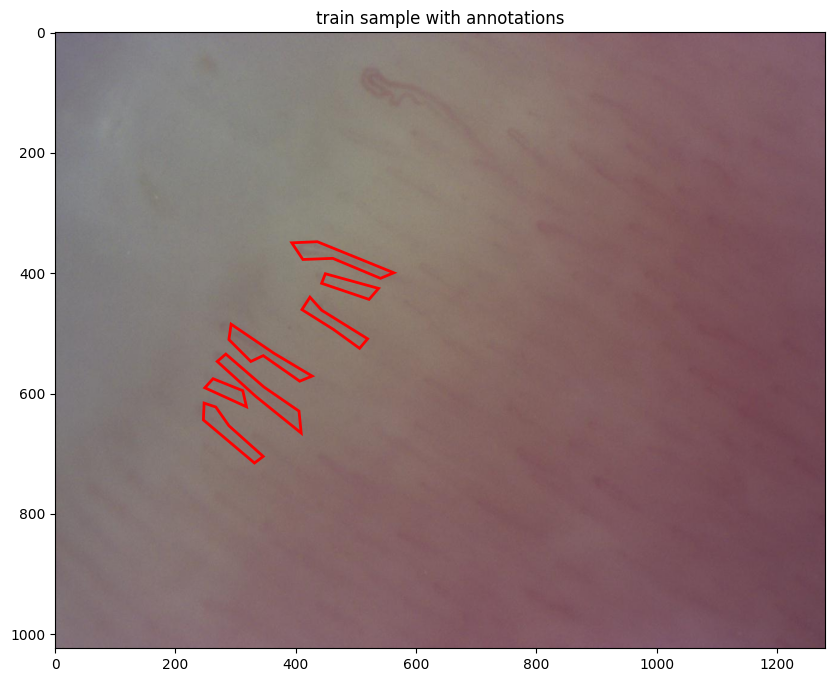

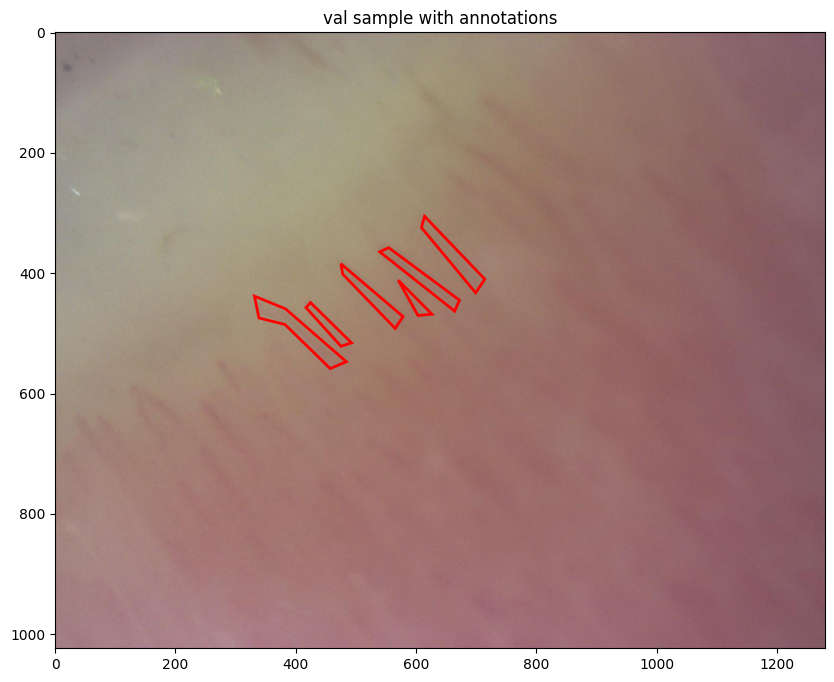


Training model...
Ultralytics 8.4.58  Python-3.12.0 torch-2.12.0+cpu CPU (12th Gen Intel Core i5-1235U)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=DATA/DATA/prepared_dataset\capillary_dataset.yaml, degrees=15.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=2, max_det=300, mixup=0.0, mode=train, model=yolov8s-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, op

In [9]:
def visualize_results(model, image_path, output_path=None):
    """Visualize model predictions on an image with detailed output"""
    # Load image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Could not load image: {image_path}")
        return
    
    # Run inference
    results = model(image_path)
    
    # Create matplotlib figure for detailed visualization
    plt.figure(figsize=(12, 8))
    
    # Show original image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    # Show predictions
    plt.subplot(1, 2, 2)
    result_img = results[0].plot()  # Get plotted image
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.title('Detected Capillaries')
    plt.axis('off')
    
    plt.tight_layout()
    
    if output_path:
        plt.savefig(output_path)
        print(f"Results saved to {output_path}")
    else:
        plt.show()

def evaluate_model(model, dataset_yaml):
    """Evaluate model performance on validation set"""
    print("\nEvaluating model performance:")
    metrics = model.val()  # Validate on test set
    print(f"mAP50: {metrics.box.map50:.3f} | mAP50-95: {metrics.box.map:.3f}")
    print(f"Mask mAP50: {metrics.seg.map50:.3f} | Mask mAP50-95: {metrics.seg.map:.3f}")
    
    # Visualize predictions on validation images
    with open(dataset_yaml) as f:
        data = yaml.safe_load(f)
    val_images_dir = os.path.join(data['path'], data['val'])
    val_images = glob.glob(os.path.join(val_images_dir, '*.jpg'))[:3]
    
    for img_path in val_images:
        visualize_results(model, img_path, f"val_result_{os.path.basename(img_path)}.png")


def main():
    # Set your paths here
    dataset_dir = 'DATA/DATA/train'  # Directory containing images and XMLs
    output_dir = 'DATA/DATA/prepared_dataset'  # Where to save prepared dataset
    
    # Step 1: Prepare dataset in YOLO format
    print("Preparing dataset...")
    dataset_yaml, class_names = prepare_dataset(dataset_dir, output_dir)
    print(f"Dataset prepared with classes: {class_names}")
    
    # Step 1.5: Verify annotations
    print("\nVerifying annotations...")
    verify_annotations(dataset_yaml)
    
    # Step 2: Train the model
    print("\nTraining model...")
    model = train_capillary_model(dataset_yaml, epochs=100, imgsz=640)
    
    # Step 3: Save the model
    model_path = 'capillary_detection_model_2.1.pt'
    model.save(model_path)
    print(f"\nModel saved to {model_path}")
    

if __name__ == '__main__':
    main()

# Capillary Detection Testing:

## 1. Load Image
- Read the image with `cv2.imread`

## 2. Align to Black Reference Line
1. Convert to grayscale.  
2. Threshold (`cv2.THRESH_BINARY_INV`) to isolate very dark pixels.  
3. Find contours; keep the largest (assumed black line).  
4. Fit a line (`cv2.fitLine`) → compute rotation angle.  
5. Rotate the whole image so the line is horizontal (`cv2.warpAffine`).  
6. Define the Region of Interest (ROI) directly above the line (≈ 40 % of image height).

## 3. YOLOv8 Detection
1. Load weights with `ultralytics.YOLO`.  
2. Run inference on the aligned image.  
3. Retain detections whose bounding‐box centroids fall inside ROI.  
4. Apply custom NMS (IoU ≤ 0.3) to remove overlaps.  
5. Return remaining boxes, masks and scores.

## 4. Outputs
- **Capillary count** within ROI (classical and/or YOLO).  
- ROI coordinates and image dimensions.  
- (Optional) matplotlib figure showing  
  - aligned image + ROI,  
  - bounding boxes / masks,  
  - final count annotation.

---

Found 4 black lines - selecting the largest one


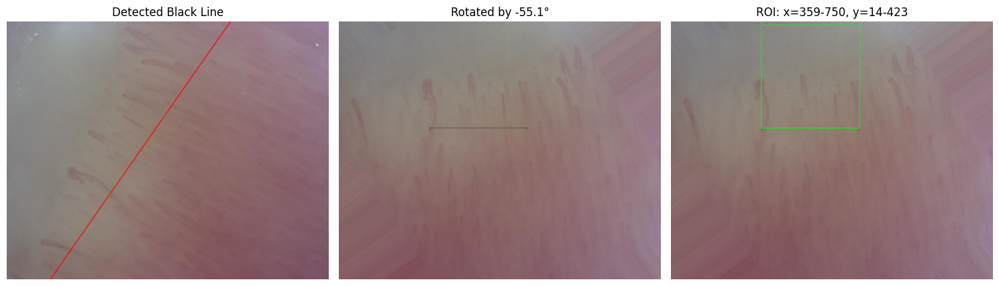


0: 512x640 155 items, 313.0ms
Speed: 4.3ms preprocess, 313.0ms inference, 348.0ms postprocess per image at shape (1, 3, 512, 640)


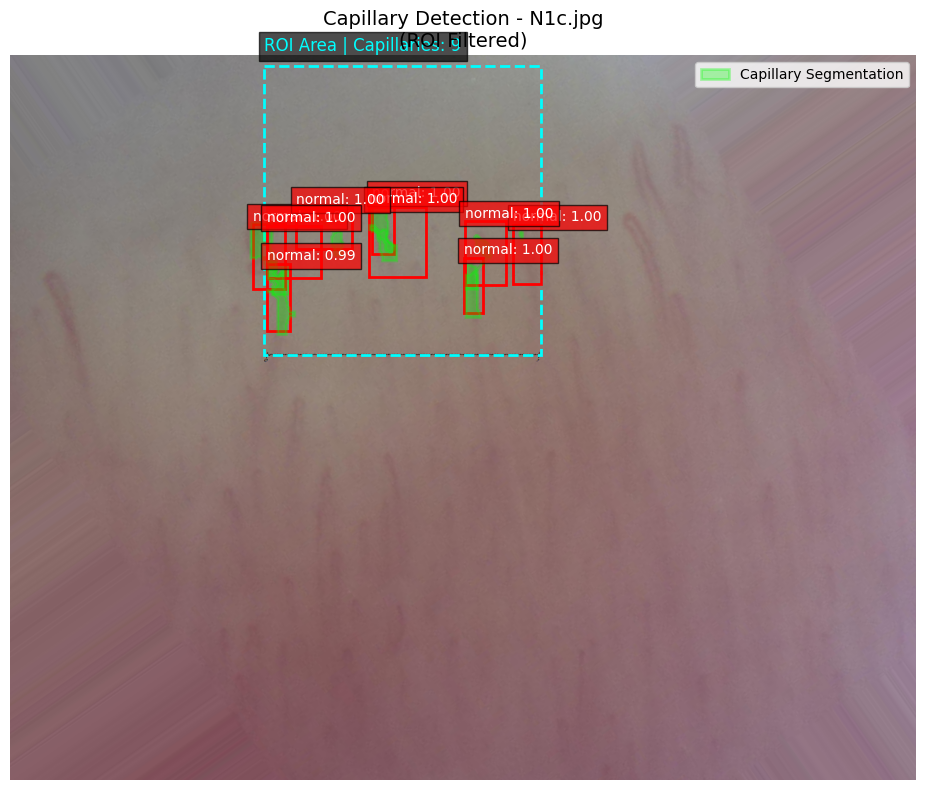

{'image_shape': (1024, 1280),
 'roi': (359, 14, 391, 409),
 'detections': [{'class_id': 0,
   'confidence': 1.0,
   'bbox': [342.2565612792969,
    238.09912109375,
    388.6058044433594,
    329.94879150390625],
   'mask': [[340.0, 236.0],
    [340.0, 286.0],
    [348.0, 286.0],
    [350.0, 284.0],
    [354.0, 284.0],
    [356.0, 286.0],
    [356.0, 288.0],
    [358.0, 290.0],
    [358.0, 294.0],
    [360.0, 296.0],
    [360.0, 298.0],
    [362.0, 300.0],
    [362.0, 308.0],
    [364.0, 310.0],
    [364.0, 312.0],
    [366.0, 314.0],
    [366.0, 316.0],
    [368.0, 318.0],
    [368.0, 320.0],
    [370.0, 320.0],
    [372.0, 322.0],
    [372.0, 324.0],
    [370.0, 326.0],
    [370.0, 338.0],
    [394.0, 338.0],
    [394.0, 298.0],
    [382.0, 298.0],
    [382.0, 306.0],
    [378.0, 310.0],
    [376.0, 308.0],
    [376.0, 304.0],
    [378.0, 302.0],
    [378.0, 298.0],
    [376.0, 296.0],
    [376.0, 288.0],
    [374.0, 286.0],
    [374.0, 282.0],
    [370.0, 278.0],
    [370.0, 276.0],

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage import measure, morphology
from glob import glob
from matplotlib.patches import Polygon
from ultralytics import YOLO


# Set matplotlib to display images inline
%matplotlib inline
def align_image_to_black_line(img,class_name, display_steps=True):
    """
    Detect the black line in the image and rotate the image to make it horizontal.
    If multiple black lines are found, selects the largest one.
    Returns the rotated image and precise ROI coordinates.
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Threshold to find black line (very dark regions)
    _, black_mask = cv2.threshold(gray, 30, 255, cv2.THRESH_BINARY_INV)
    
    # Find contours of black regions
    contours, _ = cv2.findContours(black_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if class_name=="Pathological":
        
        if  contours:
            if display_steps:
                print("No black line detected")
            h, w = img.shape[:2]
            return img, (0, w, h, h), 0.0  # Default to whole image
    else:
        if not contours:
            if display_steps:
                print("No black line detected")
            h, w = img.shape[:2]
            return img, (0, w, h, h), 0.0  # Default to whole image
    # Sort contours by area and select the largest one
    contours = sorted(contours, key=cv2.contourArea, reverse=True)
    largest_contour = contours[0]
    
    if display_steps and len(contours) > 1:
        print(f"Found {len(contours)} black lines - selecting the largest one")
    
    x, y, w, h = cv2.boundingRect(largest_contour)
    
    # Fit a line to the contour
    if len(largest_contour) >= 2:
        [vx, vy, x_fit, y_fit] = cv2.fitLine(largest_contour, cv2.DIST_L2, 0, 0.01, 0.01)
        vx, vy, x_fit, y_fit = vx[0], vy[0], x_fit[0], y_fit[0]
        
        # Calculate rotation angle
        angle_rad = np.arctan2(vy, vx)
        angle_deg = np.degrees(angle_rad)
        rotation_angle = angle_deg - 90 if angle_deg > 45 else angle_deg
        rotation_angle = float(rotation_angle)
        
        # Rotate image
        h_img, w_img = img.shape[:2]
        rotation_matrix = cv2.getRotationMatrix2D((w_img/2, h_img/2), rotation_angle, 1)
        rotated_img = cv2.warpAffine(img, rotation_matrix, (w_img, h_img), 
                                    flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
        
        # Rotate the contour points to find new position
        rotated_contour = cv2.transform(largest_contour, rotation_matrix)
        y_positions = [pt[0][1] for pt in rotated_contour]
        x_positions = [pt[0][0] for pt in rotated_contour]
        
        line_position = int(np.median(y_positions))
        x_min, x_max = int(min(x_positions)), int(max(x_positions))
        
        # NEW ROI HEIGHT CALCULATION - MORE FLEXIBLE
        # Base height on image dimensions rather than line height
        box_height = int(h_img * 0.4)  # Use 40% of image height as ROI height
        box_height = min(box_height, line_position)
        
        x_start = max(0, x_min)
        x_end = min(w_img, x_max)
        
        
        
        if display_steps:
            # Visualize the line detection and rotation
            line_img = img.copy()
            cv2.drawContours(line_img, [largest_contour], -1, (0, 255, 0), 2)
            
            # Draw the fitted line
            lefty = int((-x_fit*vy/vx) + y_fit)
            righty = int(((w_img-x_fit)*vy/vx)+y_fit)
            cv2.line(line_img, (w_img-1, righty), (0, lefty), (0, 0, 255), 2)
            
            plt.figure(figsize=(15, 5))
            plt.subplot(131), plt.imshow(cv2.cvtColor(line_img, cv2.COLOR_BGR2RGB))
            plt.title('Detected Black Line'), plt.axis('off')
            
            plt.subplot(132), plt.imshow(cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB))
            plt.title(f'Rotated by {rotation_angle:.1f}°'), plt.axis('off')
            
            # Draw the ROI on rotated image
            rotated_display = rotated_img.copy()
            cv2.rectangle(rotated_display, (x_start, line_position - box_height), 
                         (x_end, line_position), (0, 255, 0), 2)
            plt.subplot(133), plt.imshow(cv2.cvtColor(rotated_display, cv2.COLOR_BGR2RGB))
            plt.title(f'ROI: x={x_start}-{x_end}, y={line_position-box_height}-{line_position}'), plt.axis('off')
            plt.tight_layout()
            plt.show()
        
        return rotated_img, (x_start, x_end, line_position, box_height), rotation_angle
    
    return img, (0, img.shape[1], img.shape[0], img.shape[0]), 0.0

def detect_and_show_capillaries(image_path, model_path,class_name, display_steps=True):
    """
    Detect capillaries in an image and display results using matplotlib
    
    Args:
        image_path (str): Path to the input image
        model_path (str): Path to the trained model weights
        display_steps (bool): Whether to show ROI alignment steps
        
    Returns:
        dict: Detection results including masks, bounding boxes, and confidence scores
    """
    # Extract the image name for the title
    image_name = os.path.basename(image_path)
    
    # Load the trained model
    model = YOLO(model_path)
    
    # Load the image
    original_img = cv2.imread(image_path)
    if original_img is None:
        print(f"Could not load image: {image_path}")
        return None
    try:
        rotated_img, (x_start, x_end, line_position, box_height), _ = align_image_to_black_line(original_img, class_name,display_steps)
    except Exception as e:
        print(f"Error during alignment: {e}")
        rotated_img = original_img
        h, w = original_img.shape[:2]
        x_start, x_end, line_position, box_height = 0, w, h, h
    
    # Calculate ROI coordinates
    y_start = max(0, line_position - box_height)
    roi_width = x_end - x_start
    roi_height = box_height
    
    # Create ROI mask
    height, width = rotated_img.shape[:2]
    roi_mask = np.zeros((height, width), dtype=np.uint8)
    roi_mask[y_start:line_position, x_start:x_end] = 255
    
    # Run inference on the full image (but we'll filter results by ROI)
    results = model(rotated_img)
    
    # Process results
    detection_data = {
        'image_shape': results[0].orig_shape,
        'roi': (x_start, y_start, roi_width, roi_height),
        'detections': []
    }
    
    # Create matplotlib figure
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Display rotated image with ROI
    image = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB)
    ax.imshow(image)
    # Draw ROI rectangle
    roi_rect = plt.Rectangle((x_start, y_start), roi_width, roi_height, 
                           linewidth=2, edgecolor='cyan', facecolor='none', linestyle='--')
    ax.add_patch(roi_rect)
    
    # Extract detection information and collect all detections first
    all_detections = []
    for result in results:
        masks = result.masks
        boxes = result.boxes
        classes = boxes.cls
        confidences = boxes.conf
        
        for i in range(len(boxes)):
            # Get detection info
            class_id = int(classes[i])
            confidence = float(confidences[i])
            bbox = boxes[i].xyxy[0].tolist()
            mask_points = masks[i].xy[0].tolist() if masks else None
            
            # Calculate centroid to check if in ROI
            x_center = (bbox[0] + bbox[2]) / 2
            y_center = (bbox[1] + bbox[3]) / 2
            
            # Only consider detections within our ROI
            if (x_start <= x_center <= x_end and 
                y_start <= y_center <= line_position):
                all_detections.append({
                    'class_id': class_id,
                    'confidence': confidence,
                    'bbox': bbox,
                    'mask': mask_points
                })
    
    # Apply Non-Maximum Suppression (NMS) to filter overlapping boxes
    def nms(detections, overlap_threshold=0.3):
        """
        Non-Maximum Suppression to filter overlapping detections
        
        Args:
            detections: List of detection dictionaries
            overlap_threshold: IoU threshold for considering boxes as overlapping
            
        Returns:
            List of filtered detections
        """
        if len(detections) == 0:
            return []
        
        # Convert to numpy arrays for easier calculation
        boxes = np.array([d['bbox'] for d in detections])
        scores = np.array([d['confidence'] for d in detections])
        
        # Get coordinates of the boxes
        x1 = boxes[:, 0]
        y1 = boxes[:, 1]
        x2 = boxes[:, 2]
        y2 = boxes[:, 3]
        
        # Compute area of each box
        area = (x2 - x1 + 1) * (y2 - y1 + 1)
        
        # Get sorted indices by confidence score (descending)
        indices = np.argsort(scores)[::-1]
        
        # Initialize list of picked indices
        keep = []
        
        while len(indices) > 0:
            # Take the first index (highest confidence)
            i = indices[0]
            keep.append(i)
            
            # Compute IoU between this box and all remaining boxes
            xx1 = np.maximum(x1[i], x1[indices[1:]])
            yy1 = np.maximum(y1[i], y1[indices[1:]])
            xx2 = np.minimum(x2[i], x2[indices[1:]])
            yy2 = np.minimum(y2[i], y2[indices[1:]])
            
            # Compute width and height of the intersection
            w = np.maximum(0.0, xx2 - xx1 + 1)
            h = np.maximum(0.0, yy2 - yy1 + 1)
            
            # Compute intersection over union
            intersection = w * h
            iou = intersection / (area[i] + area[indices[1:]] - intersection)
            
            # Find indices of boxes to keep (IoU <= threshold)
            to_keep = np.where(iou <= overlap_threshold)[0]
            
            # Update indices to only keep these boxes
            indices = indices[to_keep + 1]
        
        # Return only the kept detections
        return [detections[i] for i in keep]
    
    # Apply NMS to our detections
    filtered_detections = nms(all_detections, overlap_threshold=0.3)  # Adjust threshold as needed
    
    # Store filtered detections and plot them
    capillary_count = 0
    polygons = []
    
    for detection in filtered_detections:
        capillary_count += 1
        detection_data['detections'].append(detection)
        
        # Get detection info
        bbox = detection['bbox']
        mask_points = detection['mask']
        confidence = detection['confidence']
        class_id = detection['class_id']
        
        # Plot bounding box
        x1, y1, x2, y2 = bbox
        width = x2 - x1
        height = y2 - y1
        rect = plt.Rectangle((x1, y1), width, height, 
                           linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        
        # Plot mask if available
        if mask_points:
            polygon = Polygon(mask_points, closed=True, 
                             edgecolor='lime', linewidth=2, 
                             facecolor='lime', alpha=0.3)
            ax.add_patch(polygon)
            polygons.append(polygon)
        
        # Add label
        label = f"{class_name if class_id == 0 else 'other'}: {confidence:.2f}"
        ax.text(x1, y1 - 5, label, color='white', 
               fontsize=10, bbox=dict(facecolor='red', alpha=0.7))
    
    # Create legend
    if polygons:
        ax.legend([polygons[0]], ['Capillary Segmentation'], 
                 loc='upper right', fontsize=10)
    
    # Add ROI and count information
    ax.text(x_start, y_start - 20, f'ROI Area | Capillaries: {capillary_count}', 
           color='cyan', fontsize=12, bbox=dict(facecolor='black', alpha=0.7))
    
    plt.title(f'Capillary Detection - {image_name}\n(ROI Filtered)', fontsize=14)
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    
    return detection_data
    
    # Print detection summary
    print(f"\nDetection Summary:")
    print(f"Image size: {detection_data['image_shape']}")
    print(f"ROI coordinates (x,y,w,h): {detection_data['roi']}")
    print(f"Number of capillaries detected in ROI: {len(detection_data['detections'])}")
    
    return detection_data
class_name="normal"
detect_and_show_capillaries("DATA/DATA/N1/N1c.jpg","capillary_detection_model2.1.pt",class_name) 

## Detect the Pathological data

No black line detected

0: 512x640 7 items, 269.7ms
Speed: 3.2ms preprocess, 269.7ms inference, 8.3ms postprocess per image at shape (1, 3, 512, 640)


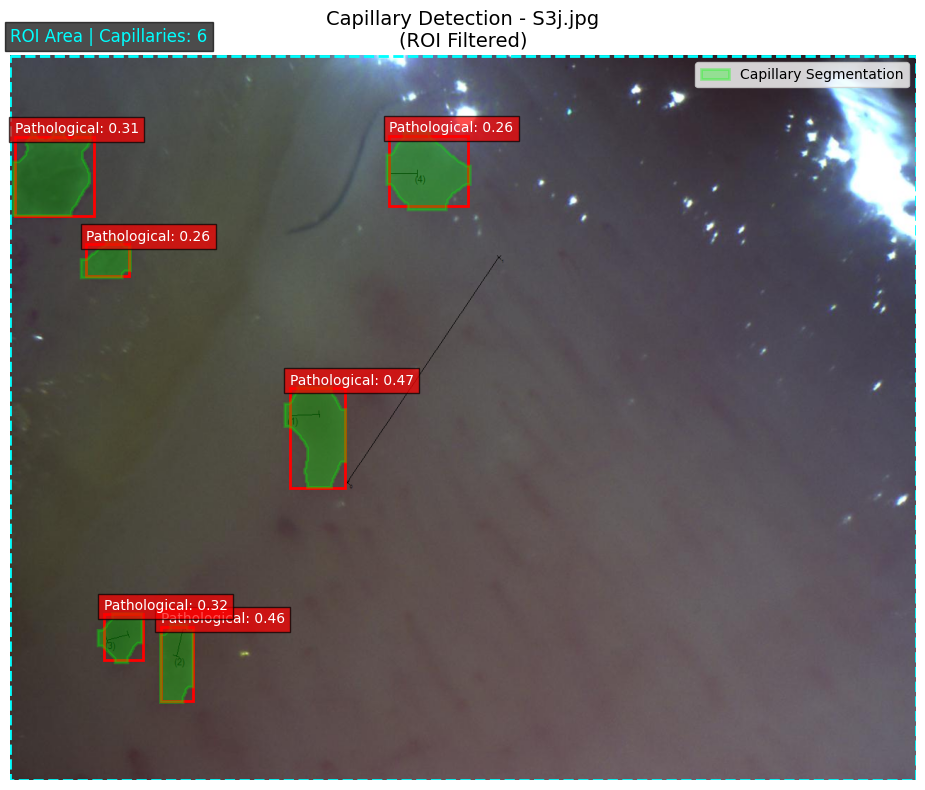

{'image_shape': (1024, 1280),
 'roi': (0, 0, 1280, 1024),
 'detections': [{'class_id': 0,
   'confidence': 0.474762886762619,
   'bbox': [394.92138671875,
    469.9678649902344,
    473.1522216796875,
    611.1077880859375],
   'mask': [[406.0, 468.0],
    [406.0, 474.0],
    [402.0, 478.0],
    [402.0, 480.0],
    [400.0, 482.0],
    [400.0, 484.0],
    [398.0, 486.0],
    [398.0, 488.0],
    [394.0, 492.0],
    [388.0, 492.0],
    [388.0, 524.0],
    [394.0, 524.0],
    [396.0, 526.0],
    [398.0, 526.0],
    [410.0, 538.0],
    [410.0, 540.0],
    [416.0, 546.0],
    [416.0, 548.0],
    [418.0, 550.0],
    [418.0, 552.0],
    [420.0, 554.0],
    [420.0, 572.0],
    [418.0, 574.0],
    [418.0, 582.0],
    [416.0, 584.0],
    [416.0, 590.0],
    [418.0, 592.0],
    [418.0, 602.0],
    [420.0, 604.0],
    [420.0, 610.0],
    [454.0, 610.0],
    [454.0, 604.0],
    [456.0, 602.0],
    [456.0, 598.0],
    [458.0, 596.0],
    [458.0, 594.0],
    [460.0, 592.0],
    [460.0, 590.0],
    [46

In [11]:
class_name="Pathological"
detect_and_show_capillaries("DATA/DATA/S3/S3j.jpg","capillary_detection_model_S.pt",class_name) 

## Comparison of Predicted Data vs Ground Truth

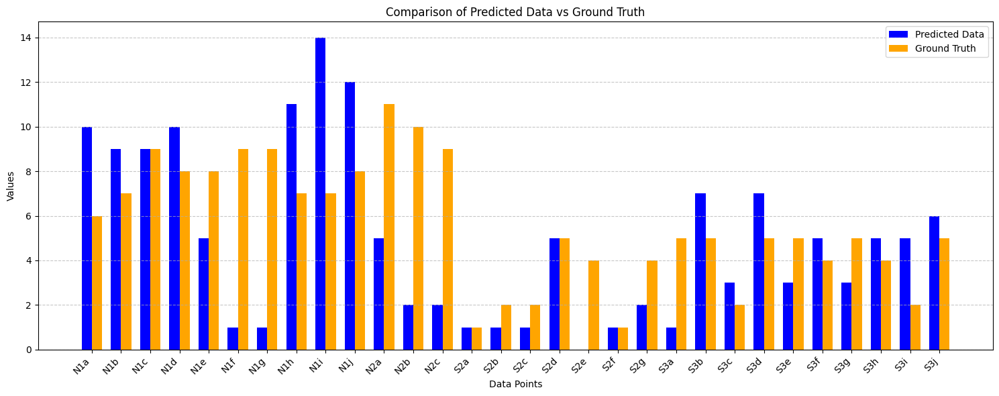

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Predicted data
n1 = [10, 9, 9, 10, 5, 1, 1, 11, 14, 12]
n2=[5,2,2]
patha_s2 = [1, 1, 1, 5, 0, 1, 2]
patha_s3 = [1, 7, 3, 7, 3, 5, 3, 5, 5,6]

# Ground truth labels and values
ground_truth_labels = [
    'N1a', 'N1b', 'N1c', 'N1d', 'N1e', 'N1f', 'N1g', 'N1h', 'N1i', 'N1j',
    'N2a', 'N2b', 'N2c',
    'S2a', 'S2b', 'S2c', 'S2d', 'S2e', 'S2f', 'S2g',
    'S3a', 'S3b', 'S3c', 'S3d', 'S3e', 'S3f', 'S3g', 'S3h', 'S3i', 'S3j'
]

ground_truth_values = [
    6, 7, 9, 8, 8, 9, 9, 7, 7, 8,
    11, 10, 9,
    1, 2, 2, 5, 4, 1, 4,
    5, 5, 2, 5, 5, 4, 5, 4, 2, 5
]

# Combine given data (assuming N1, S2, S3 are aligned with ground truth)
given_data = n1 +n2+ patha_s2 + patha_s3

# Since ground truth has more entries, we'll only compare available data
min_length = min(len(given_data), len(ground_truth_values))
given_data = given_data[:min_length]
ground_truth_values = ground_truth_values[:min_length]
ground_truth_labels = ground_truth_labels[:min_length]

# Create a grouped bar chart
x = np.arange(len(ground_truth_labels))
width = 0.35  # Width of the bars

plt.figure(figsize=(15, 6))
plt.bar(x - width/2, given_data, width, label='Predicted Data', color='blue')
plt.bar(x + width/2, ground_truth_values, width, label='Ground Truth', color='orange')

plt.xlabel('Data Points')
plt.ylabel('Values')
plt.title('Comparison of Predicted Data vs Ground Truth')
plt.xticks(x, ground_truth_labels, rotation=45, ha='right')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Discussion

In this project, we explored two different approaches for nailfold capillary detection and counting: a traditional image processing pipeline and a deep learning-based segmentation method using YOLOv8. While both approaches showed potential, neither produced fully satisfactory results across the entire dataset.

One key limitation was the quality and consistency of the annotations. Our annotations were manually created and may lack the precision and consistency required for robust model training and evaluation. We believe that with expert-annotated data, ideally from medical professionals or specialists in capillaroscopy, the deep learning model could achieve significantly higher accuracy and generalization.

The traditional method, although interpretable and simple to implement, was sensitive to variations in contrast, background noise, and capillary morphology. On the other hand, the deep learning approach showed better adaptability but required more high-quality, diverse training samples to perform reliably across both normal and pathological images.
